In [1]:
import numpy as np
import tensorflow as tf

# Instead of using Keras API to feed image into the model,
# we need our own Variable tensor so we can use it directly.
input_tn = tf.Variable(np.empty([1, 224, 224, 3]), dtype='float32')

# Note that we load the model without any fully connected layers,
# since we will not use this model as a classifier in this notebook.
from tensorflow.keras.applications.densenet import DenseNet121, preprocess_input
model = DenseNet121(input_tensor=input_tn, include_top=False, input_shape=(224, 224, 3))

Instructions for updating:
Colocations handled automatically by placer.
29089792/29084464 [==============================] - 36s 1us/step


In [ ]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

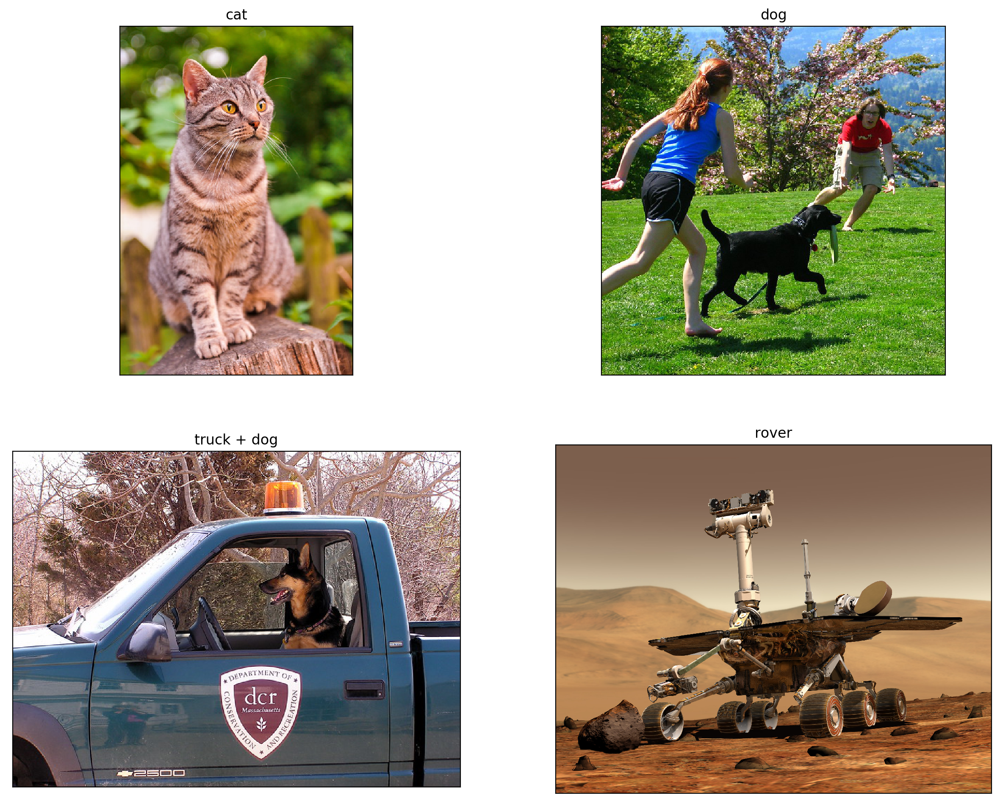

In [3]:
from utils import plot_image, load_tiny_batch, plot_images_grid

# Loads a tiny batch of images from Internet
images_raw = load_tiny_batch()
plot_images_grid(images_raw)

In [4]:
import numpy as np
from utils import crop_and_resize_for_imagenet

# Cropped and/or resized into ImageNet shape 224x244x3 array of type uint8 [0, 255]
images_resized = np.array([crop_and_resize_for_imagenet(i) for i in images_raw.values()])

# Rescaled RGB distribution to match ImageNet
# images_rescaled = preprocess_input(images_resized)

In [49]:
images_resized.shape

(4, 224, 224, 3)

In [6]:
# Note that we need to get Tenserflow session from Keras,
# because it's the only session where VGG16 is initialized
# with the pre-trained weights. New sessions have random initialization.
s = tf.keras.backend.get_session()

In [39]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (1, 224, 224, 3)     0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (1, 230, 230, 3)     0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (1, 112, 112, 64)    9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalizationV1) (1, 112, 112, 64)    256         conv1/conv[0][0]                 
__________________________________________________________________________________________________
conv1/relu

In [9]:
# In order to visualize the first layer's kernels directly,
# we can look at the list weights and choose the first convolution.
variables = {w.name:w for w in model.weights}
variables

{'conv1/conv/kernel:0': <tf.Variable 'conv1/conv/kernel:0' shape=(7, 7, 3, 64) dtype=float32>,
 'conv1/bn/gamma:0': <tf.Variable 'conv1/bn/gamma:0' shape=(64,) dtype=float32>,
 'conv1/bn/beta:0': <tf.Variable 'conv1/bn/beta:0' shape=(64,) dtype=float32>,
 'conv2_block1_0_bn/gamma:0': <tf.Variable 'conv2_block1_0_bn/gamma:0' shape=(64,) dtype=float32>,
 'conv2_block1_0_bn/beta:0': <tf.Variable 'conv2_block1_0_bn/beta:0' shape=(64,) dtype=float32>,
 'conv2_block1_1_conv/kernel:0': <tf.Variable 'conv2_block1_1_conv/kernel:0' shape=(1, 1, 64, 128) dtype=float32>,
 'conv2_block1_1_bn/gamma:0': <tf.Variable 'conv2_block1_1_bn/gamma:0' shape=(128,) dtype=float32>,
 'conv2_block1_1_bn/beta:0': <tf.Variable 'conv2_block1_1_bn/beta:0' shape=(128,) dtype=float32>,
 'conv2_block1_2_conv/kernel:0': <tf.Variable 'conv2_block1_2_conv/kernel:0' shape=(3, 3, 128, 32) dtype=float32>,
 'conv2_block2_0_bn/gamma:0': <tf.Variable 'conv2_block2_0_bn/gamma:0' shape=(96,) dtype=float32>,
 'conv2_block2_0_bn/be

In [10]:
# In order to look at the activation map,
# we need to find the convolution operation first.
[op for op in s.graph.get_operations() if op.type == 'Conv2D']

[<tf.Operation 'conv1/conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block1_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block1_2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block2_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block2_2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block3_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block3_2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block4_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block4_2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block5_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block5_2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block6_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv2_block6_2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'pool2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv3_block1_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv3_block1_2_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv3_block2_1_conv/Conv2D' type=Conv2D>,
 <tf.Operation 'conv3_block2_2_c

In [10]:
# If you need extra help finding the right operation,
# you can save the graph for Tensorboard.
# with tf.Session() as s:
#     tf.summary.FileWriter(
#         'tf_logs',
#         graph=s.graph,
#         session=s
#     ).close()

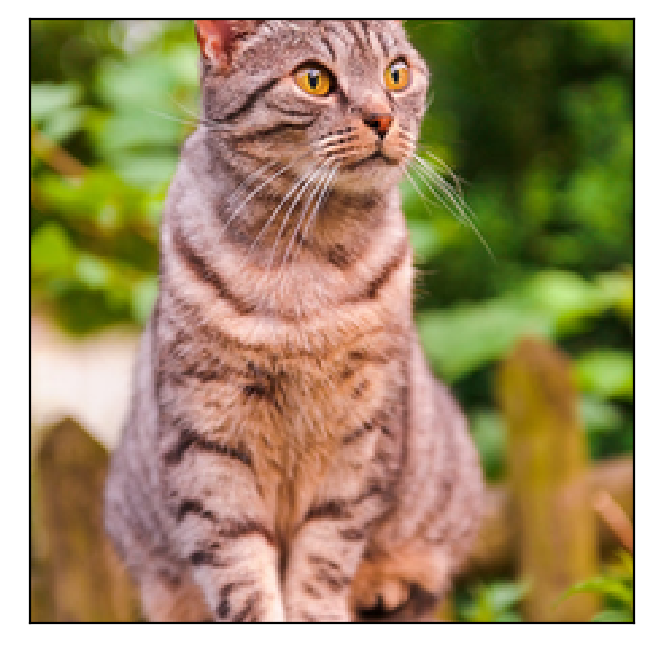

In [50]:
import numpy as np

def plot_input(image):
    plt.imshow(image / 255)
    plt.xticks([])
    plt.yticks([])

image_id = 0

# Let's select the first image.
image_start = images_resized[[image_id]]
plot_input(images_resized[image_id])

In [45]:
# Each Tensorflow operation has zero or more tensors that
# correspond to that operation's output. In the case
# of Conv2D operation, the 0th output is the activation map.
# We can extract those tensors by adding :0 to the operation name.
conv_tn = s.graph.get_tensor_by_name('conv2_block2_1_conv/Conv2D:0')
# relu_tn = s.graph.get_tensor_by_name('block5_conv1/Relu:0')
max_tn = s.graph.get_tensor_by_name('pool4_conv/Conv2D:0')

# Each tensor is batch x height x width x channels,
# but since we only want to look at one image, we can drop others.
activation_volume_tn = conv_tn[0]
activation_volume_tn.shape

TensorShape([Dimension(56), Dimension(56), Dimension(128)])

In [46]:
# In order to feed the network with image_start,
# the image has to be assigned to the input variable
# that was created passed into VGG16() constructor call.
s.run(tf.assign(input_tn, image_start))

# Now let's evaluate the activation volume tensor.
activation_volume = s.run(activation_volume_tn)

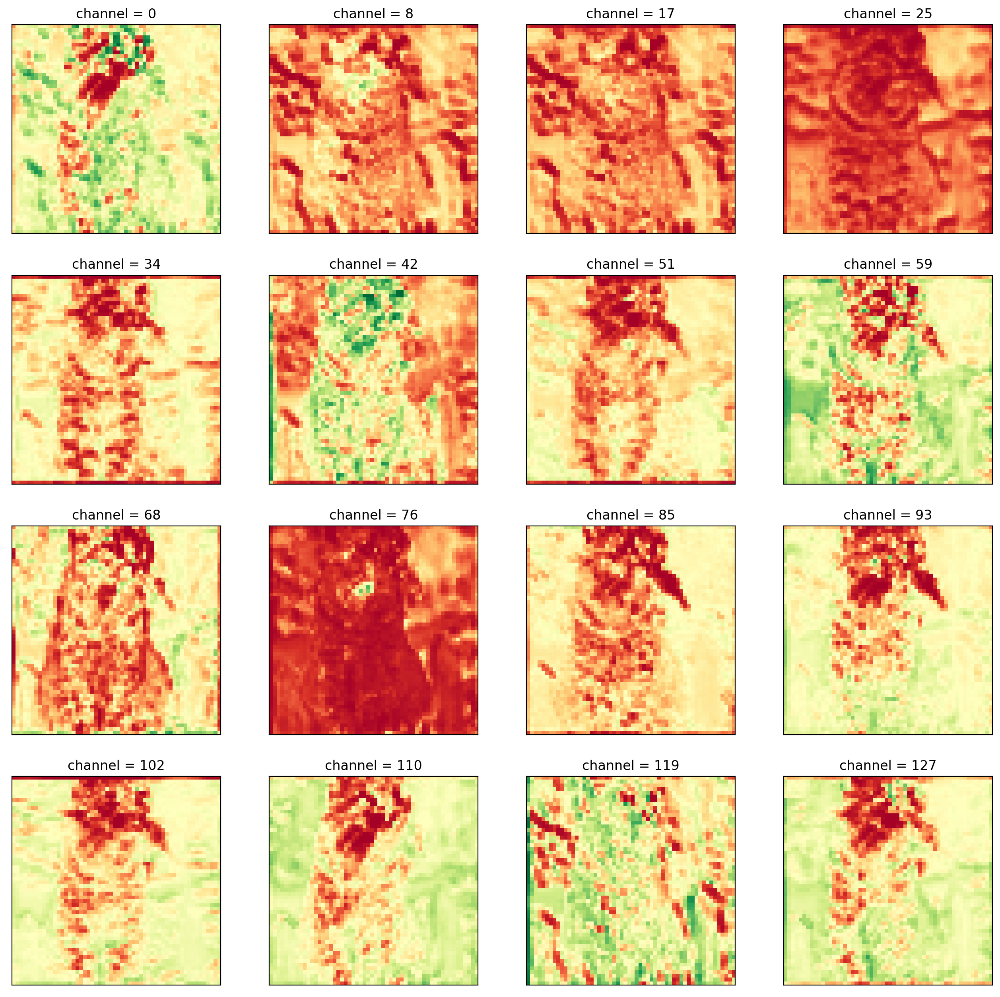

In [47]:
from utils import plot_activation_volume
plot_activation_volume(activation_volume, side=4)

In [33]:
filter_channel = 443
activation_map_tn = activation_volume_tn[:, :, filter_channel]
activation_map_tn.shape

TensorShape([Dimension(14), Dimension(14)])

In [34]:
cost_tn = -tf.reduce_mean(activation_map_tn) # + 0.001 * tf.norm(input_tn)
gradient_op = tf.gradients(cost_tn, input_tn)

learning_rate = 1000000
new_image_tn = input_tn - learning_rate * gradient_op[0]
new_image_tn = tf.clip_by_value(new_image_tn, 0, 255)

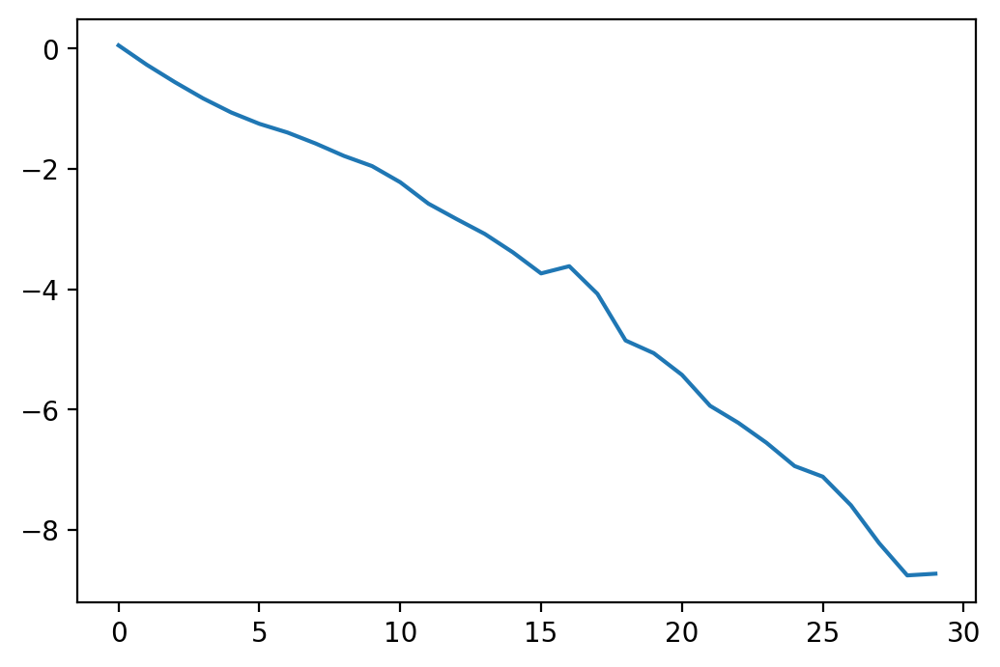

In [35]:
import seaborn as sns
gradients = []
learning_curve = []
activations = []
images = []

image_current = image_start
for i in range(30):
    images.append(image_current[0])
    s.run(input_tn.assign(image_current))
    image_new, activation, cost, grad = s.run([
        new_image_tn, 
        activation_map_tn, 
        cost_tn, 
        gradient_op
    ])
    
    gradients.append(grad)
    learning_curve.append(cost)
    activations.append(activation)
    
    image_current = image_new
    
sns.lineplot(range(len(learning_curve)), learning_curve)

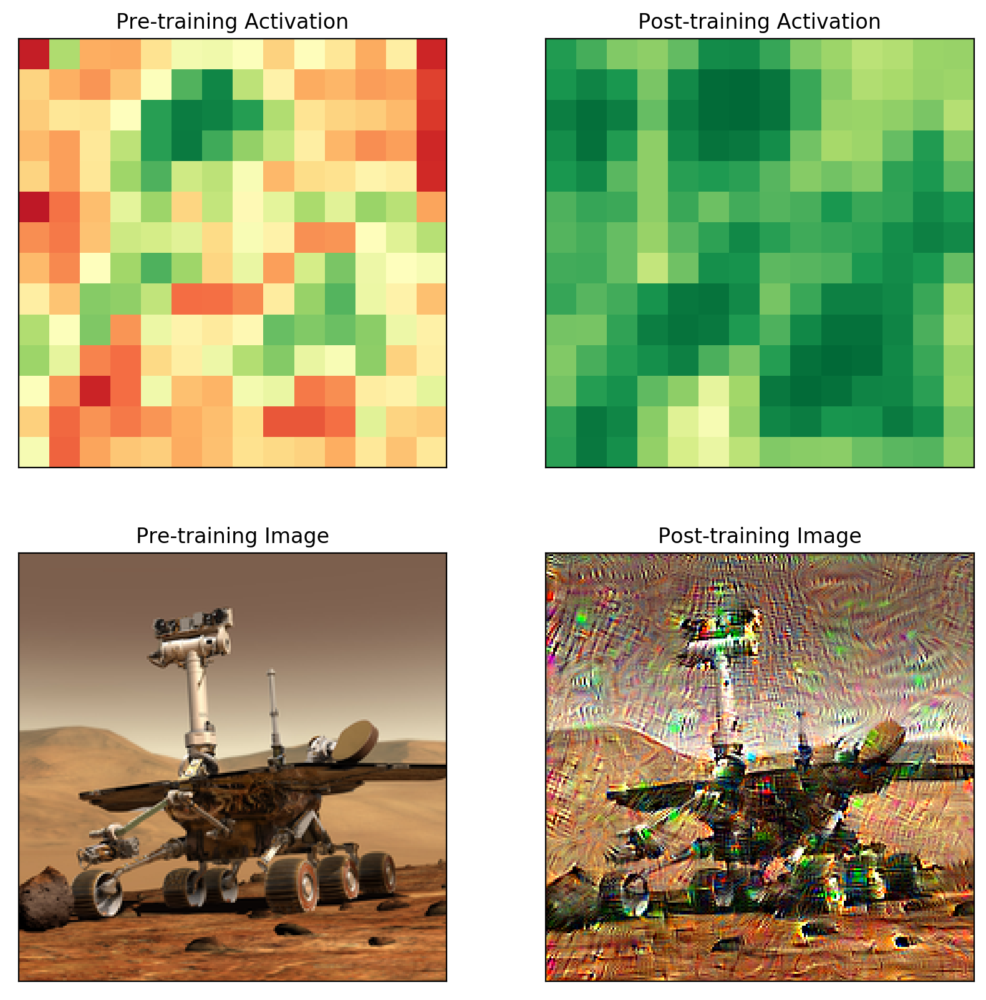

In [36]:
from utils import plot_activation_map

plt.figure(figsize=[10, 10])

plt.subplot(2, 2, 1)
plt.title('Pre-training Activation')
plot_activation_map(activations[0])
plt.subplot(2, 2, 2)
plt.title('Post-training Activation')
plot_activation_map(activations[-1])
plt.subplot(2, 2, 3)
plt.title('Pre-training Image')
plot_input(images[0])
plt.subplot(2, 2, 4)
plt.title('Post-training Image')
plot_input(images[-1])

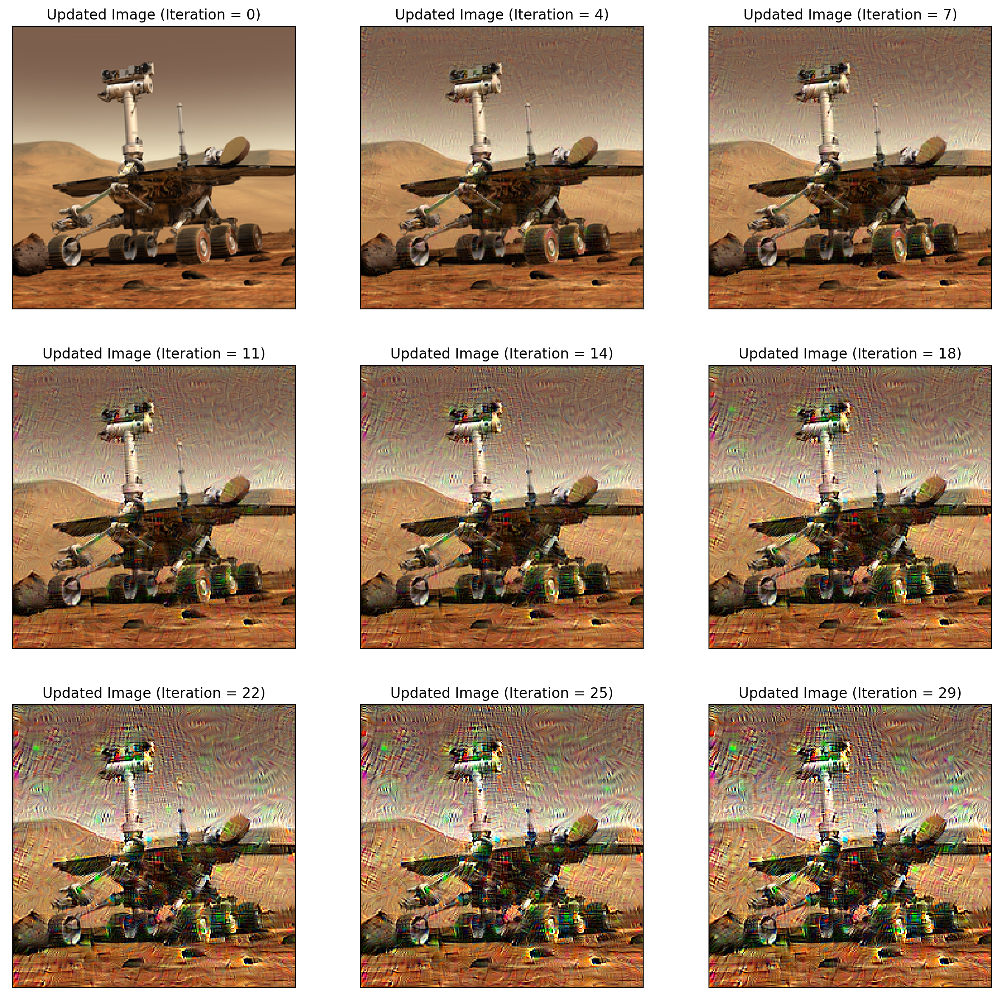

In [37]:
nrows = 3
ncols = 3
idxs = np.linspace(0, len(images)-1, 9).round().astype(int)

plt.figure(figsize=[5 * ncols, 5 * nrows])
for i, idx in enumerate(idxs):
    plt.subplot(nrows, ncols, i+1)
    plot_input(images[idx])
    plt.title(f'Updated Image (Iteration = {idx})')

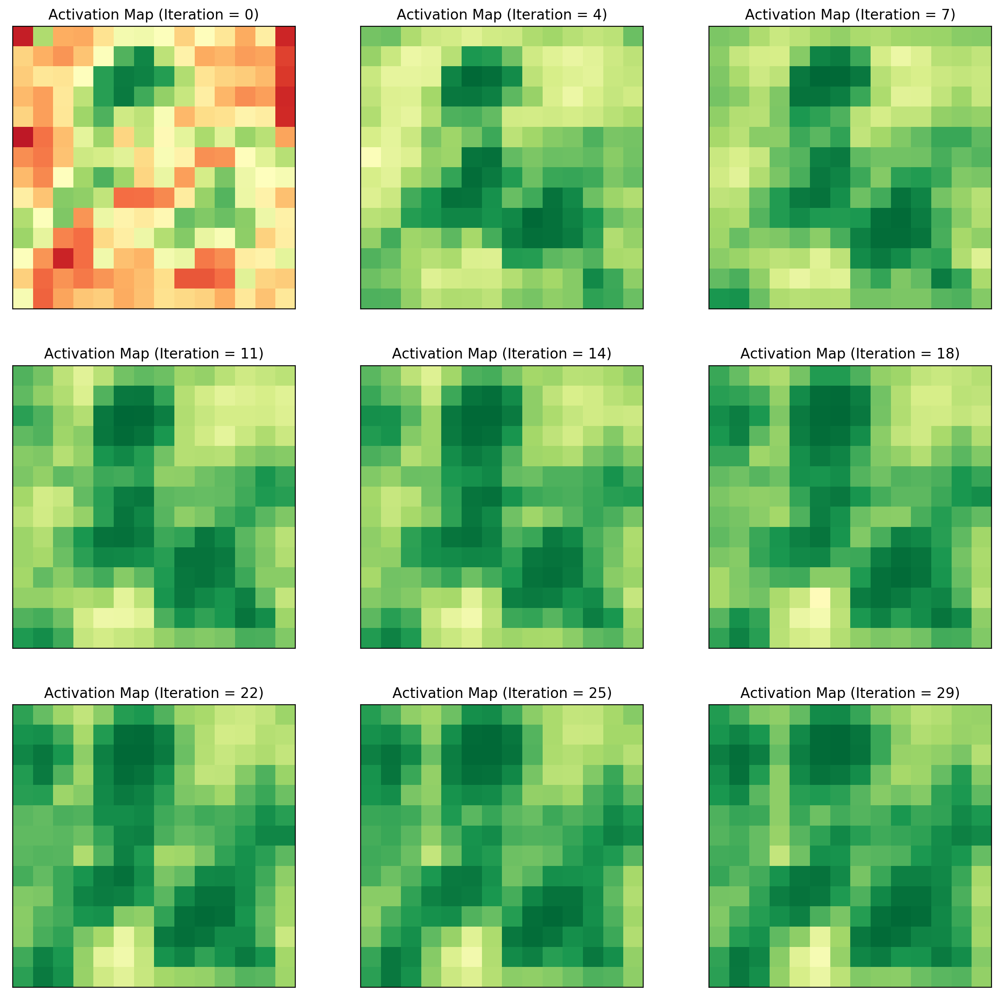

In [38]:
nrows = 3
ncols = 3
idxs = np.linspace(0, len(activations)-1, 9).round().astype(int)

plt.figure(figsize=[5 * ncols, 5 * nrows])
for i, idx in enumerate(idxs):
    plt.subplot(nrows, ncols, i+1)
    plot_activation_map(activations[idx])
    plt.title(f'Activation Map (Iteration = {idx})')

In [22]:
activations[0].mean(), activations[-1].mean()

(0.29098576, 4.458808)

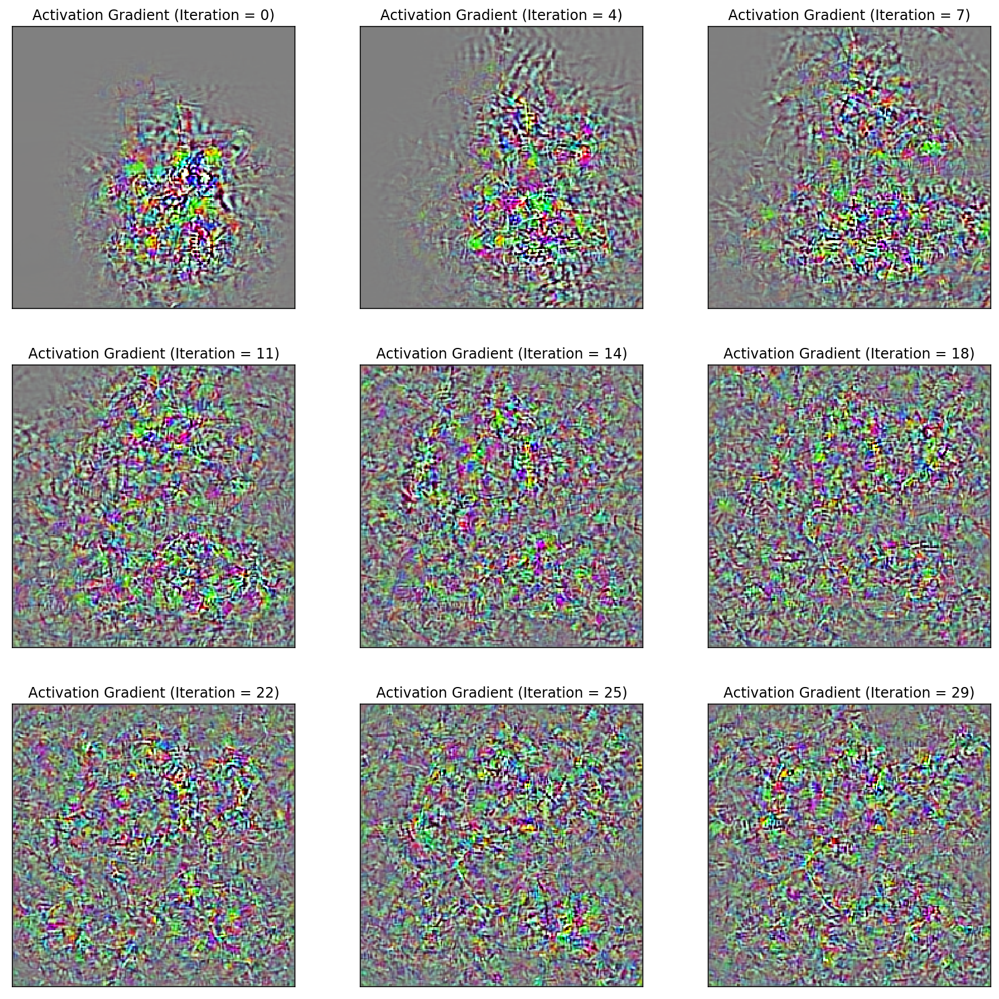

In [23]:
from utils import plot_gradient

nrows = 3
ncols = 3
idxs = np.linspace(0, len(gradients)-1, nrows*ncols).round().astype(int)

plt.figure(figsize=[5 * ncols, 5 * nrows])
for i, idx in enumerate(idxs):
    plt.subplot(nrows, ncols, i+1)
    grad = gradients[idx][0][0]
    plot_gradient(grad)
    plt.title(f'Activation Gradient (Iteration = {idx})')

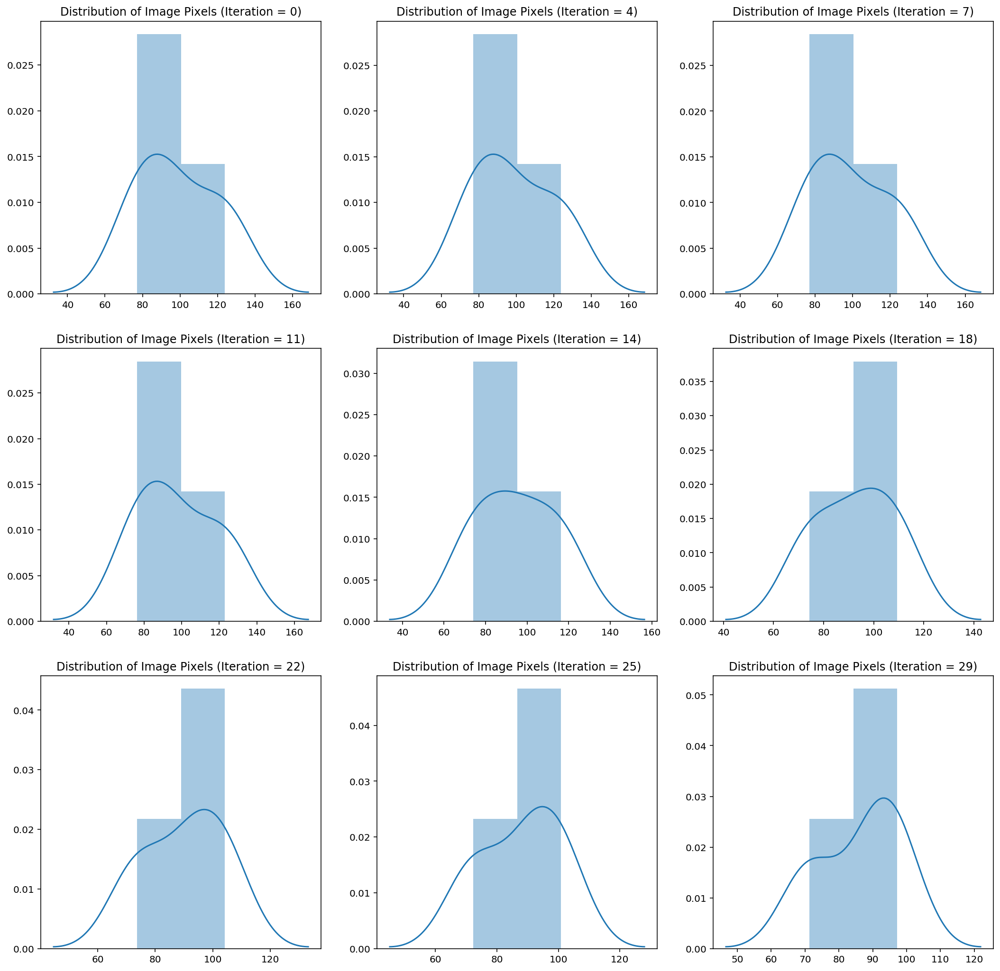

In [24]:
import seaborn as sns
import math

nrows = 3
ncols = 3
idx = np.linspace(0, len(images)-1, 9).round().astype(int)

plt.figure(figsize=[6*ncols, 6*nrows])
for i in range(nrows*ncols):
    plt.subplot(nrows, ncols, i+1)
    plt.title(f'Distribution of Image Pixels (Iteration = {idx[i]})')
    sns.distplot(images[idx[i]][0][0].reshape(-1))

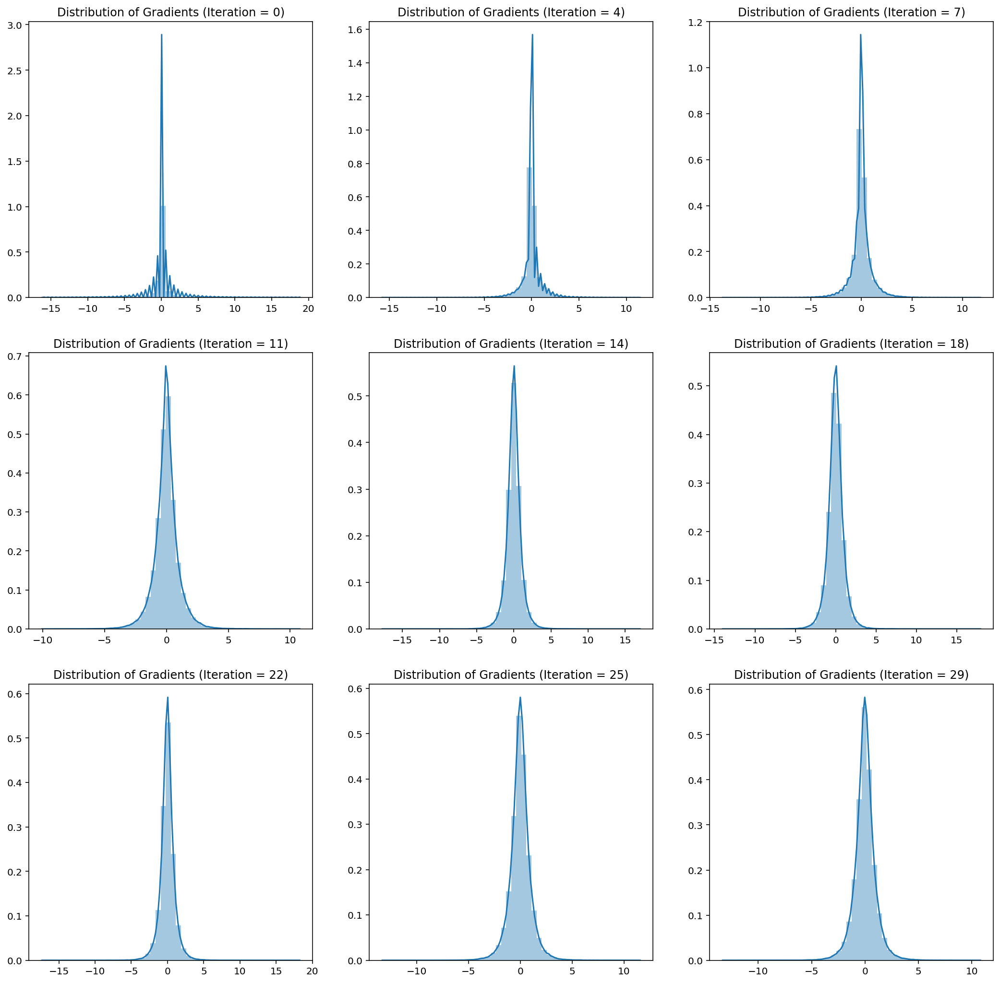

In [25]:
import seaborn as sns
import math

nrows = 3
ncols = 3
idxs = np.linspace(0, len(gradients)-1, ncols*nrows).round().astype(int)

plt.figure(figsize=[6*ncols, 6*nrows])
for i, idx in enumerate(idxs):
    plt.subplot(nrows, ncols, i+1)
    plt.title(f'Distribution of Gradients (Iteration = {idx})')
    sns.distplot(gradients[idx][0][0].reshape(-1))

In [26]:
from PIL import Image
import os

previous_dreams = [
    int(n.split('dream')[1]) for n in os.listdir('.') 
    if n.startswith('dream')
]

if len(previous_dreams) > 0:
    next_dream = max(previous_dreams) + 1
else:
    next_dream = 0

os.system(f'mkdir -p dream{next_dream}')
for idx, image in enumerate(images):
    Image.fromarray(image.astype('uint8')).save(f'dream{next_dream}/{idx}.png')